# Project Outline

## 1. Load Data
1. Parse a file using Python (e.g., using the `csv` module) and create a normalized database from it.
2. Write an SQL query with joins to reconstruct the data and load it into a Pandas DataFrame.

---

## 2. Clean, Preprocess, and Explore Data

### Data Cleaning
Data scientists often say that 80% of their work involves cleaning data. But what does it mean to “clean data”? Below is a partial list of common data cleaning tasks (Ref: Lerner, R. M. (2024). *Pandas Workout*, Manning Publications):

1. Rename columns.
2. Rename the index.
3. Remove irrelevant columns.
4. Split one column into two.
5. Combine two or more columns into one.
6. Remove non-data rows.
7. Remove repeated rows.
8. Remove rows with missing data (NaN).
9. Replace NaN values with a single value.
10. Replace NaN values via interpolation.
11. Standardize strings.
12. Fix typos in strings.
13. Remove whitespace from strings.
14. Correct column data types.
15. Identify and remove outliers.

---

### Exploratory Data Analysis (EDA)
EDA is a critical step in the data analysis process. It involves examining and summarizing a dataset to uncover patterns, relationships, anomalies, and insights. This step is typically performed before formal modeling or hypothesis testing and helps analysts understand the structure of the data, identify potential issues, and guide further analysis.

#### Key Objectives of EDA:
1. **Understand the Dataset**:
   - Identify the types of variables (numerical, categorical, etc.).
   - Assess the size, structure, and completeness of the data.

2. **Detect Missing or Anomalous Data**:
   - Identify missing values, outliers, or inconsistencies that may need to be addressed.

3. **Summarize Key Characteristics**:
   - Use descriptive statistics (mean, median, standard deviation, etc.) to summarize the data.

4. **Visualize Data**:
   - Create visualizations (e.g., histograms, scatter plots, box plots) to identify patterns, trends, and relationships.

5. **Identify Relationships**:
   - Explore correlations and interactions between variables.

---

#### Common Techniques in EDA:
1. **Descriptive Statistics**:
   - Measures of central tendency (mean, median, mode).
   - Measures of dispersion (variance, standard deviation, range, interquartile range).

2. **Data Visualization**:
   - **Univariate Analysis**: Histograms, box plots, density plots.
   - **Bivariate Analysis**: Scatter plots, correlation heatmaps, pair plots.
   - **Multivariate Analysis**: 3D plots, parallel coordinate plots.

3. **Handling Missing Data**:
   - Identify missing values and decide how to handle them (e.g., imputation, removal).

4. **Outlier Detection**:
   - Use box plots, z-scores, or interquartile range (IQR) to identify extreme values.

5. **Correlation Analysis**:
   - Calculate correlation coefficients to measure relationships between variables.

---

## 3. Train Models
1. Start with a baseline model using Logistic Regression and log this in MLflow on DagsHub.
2. Experiment with different algorithms and fine-tune hyperparameters. At each stage, justify your decisions. Log all experiments in MLflow/DagsHub.
3. Select the best model based on the confusion matrix.

---

## 4. Deploy Final Model
- Use a Docker container to deploy the final model on DigitalOcean or any other service of your choice.

---

## 5. Create a Streamlit App
1. Build a Streamlit app to interact with the deployed model and make new predictions.
2. Save all user inputs and display the last 5 predictions.

---

## 6. Record a Video
- Create a video explaining your project.

---

## 7. Update Jupyter Book Website
- Showcase your project on your Jupyter Book website.

---

## 8. Submit Grade Sheet
- Submit the completed grade sheet on UB Learns.

In [4]:
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport

profile = ProfileReport(housing, title="Pandas Profiling Report")

In [5]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
%config InteractiveShell.ast_node_interactivity = "all"


In [12]:
# Step 2
import pandas as pd
housing = pd.read_csv("./housing.csv") # https://github.com/ageron/data/tree/main/housing
housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


## Inspect the data to get an understanding of the column and data types

- Inspect the data to get an understanding of the column and data types
- Remember, in PandasV2 string/text attributes are treated as object data types
- Look for missing values
- Categorize the columns/attributes into numberical and categorical
    - Numerical values deal with numbers and quantities, enabling mathematical analysis.
    - Categorical values deal with labels or groups, used for classification or grouping.

In [ ]:
housing.info()

In [2]:
housing["ocean_proximity"].value_counts()

ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64

In [ ]:
# Summary of Numerical Attributes
housing.describe()

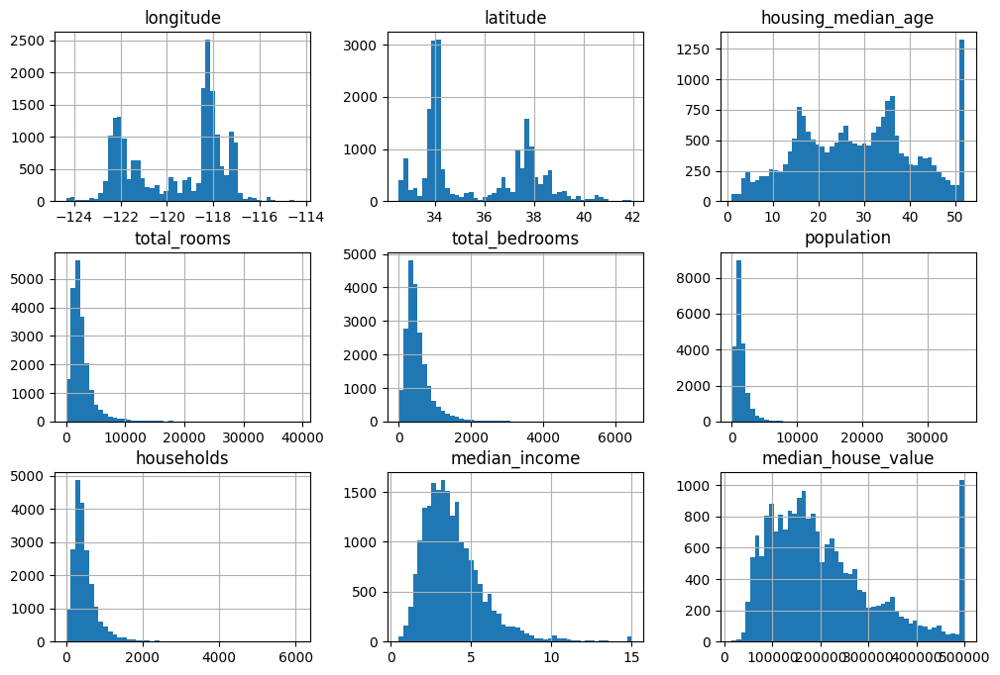

In [3]:
import matplotlib.pyplot as plt

housing.hist(bins=50, figsize=(12, 8))
plt.show()

# Make Observations!
- Median income is scaled and capped at 15. It does not correspond to the actual dollar amount (e.g., 1 = \$10,000).
- Housing median age is capped.
- Median house value (the target variable) is also capped. This means predictions are limited to the capped value.  
    - This issue can be addressed by either obtaining the correct uncapped values or removing these capped entries.
- The attributes have different scales.
- Many histograms are skewed to the right.

# Before doing anything, split the data and possibly stratify!
- We know that median income is the most important feature so far. Let's split the data into training and testing sets, ensuring that both sets have the same distribution of income categories.



<Axes: xlabel='income_cat'>

Text(0.5, 0, 'Income category')

Text(0, 0.5, 'Number of districts')

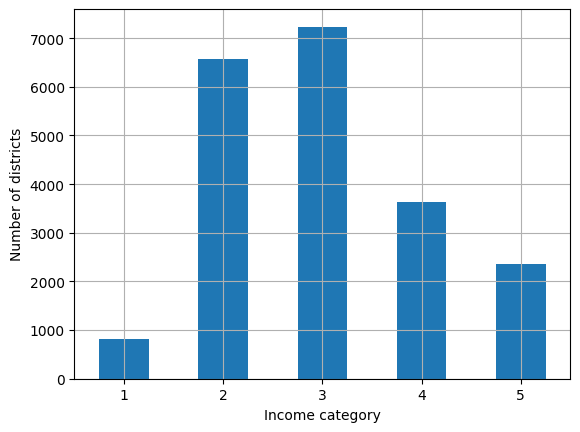

In [13]:
housing["income_cat"] = pd.cut(housing["median_income"], bins=[0, 1.5, 3.0, 4.5, 6, np.inf], labels=[1, 2, 3, 4, 5])
housing["income_cat"].value_counts().sort_index().plot.bar(rot=0, grid=True)
plt.xlabel("Income category")
plt.ylabel("Number of districts")
plt.show()

In [14]:
from sklearn.model_selection import train_test_split
strat_train_set, strat_test_set = train_test_split(housing, test_size=0.20, stratify=housing["income_cat"], random_state=42)
strat_train_set["income_cat"].value_counts() / len(strat_train_set)
strat_test_set["income_cat"].value_counts() / len(strat_test_set)
for set_ in (strat_train_set, strat_test_set):
    set_.drop("income_cat", axis=1, inplace=True)
housing = strat_train_set.copy()

income_cat
3    0.350594
2    0.318859
4    0.176296
5    0.114462
1    0.039789
Name: count, dtype: float64

income_cat
3    0.350533
2    0.318798
4    0.176357
5    0.114341
1    0.039971
Name: count, dtype: float64

                    longitude  latitude  housing_median_age  total_rooms  \
longitude            1.000000 -0.924213           -0.102937     0.044558   
latitude            -0.924213  1.000000            0.005692    -0.036753   
housing_median_age  -0.102937  0.005692            1.000000    -0.361710   
total_rooms          0.044558 -0.036753           -0.361710     1.000000   
total_bedrooms       0.068210 -0.066391           -0.317978     0.930076   
population           0.104236 -0.115677           -0.301906     0.863967   
households           0.054261 -0.071604           -0.300075     0.916143   
median_income       -0.016542 -0.078137           -0.127043     0.197720   
median_house_value  -0.050859 -0.139584            0.102175     0.137455   

                    total_bedrooms  population  households  median_income  \
longitude                 0.068210    0.104236    0.054261      -0.016542   
latitude                 -0.066391   -0.115677   -0.071604      -0.078137   
housing_

<Figure size 1000x800 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Correlation Matrix Heatmap')

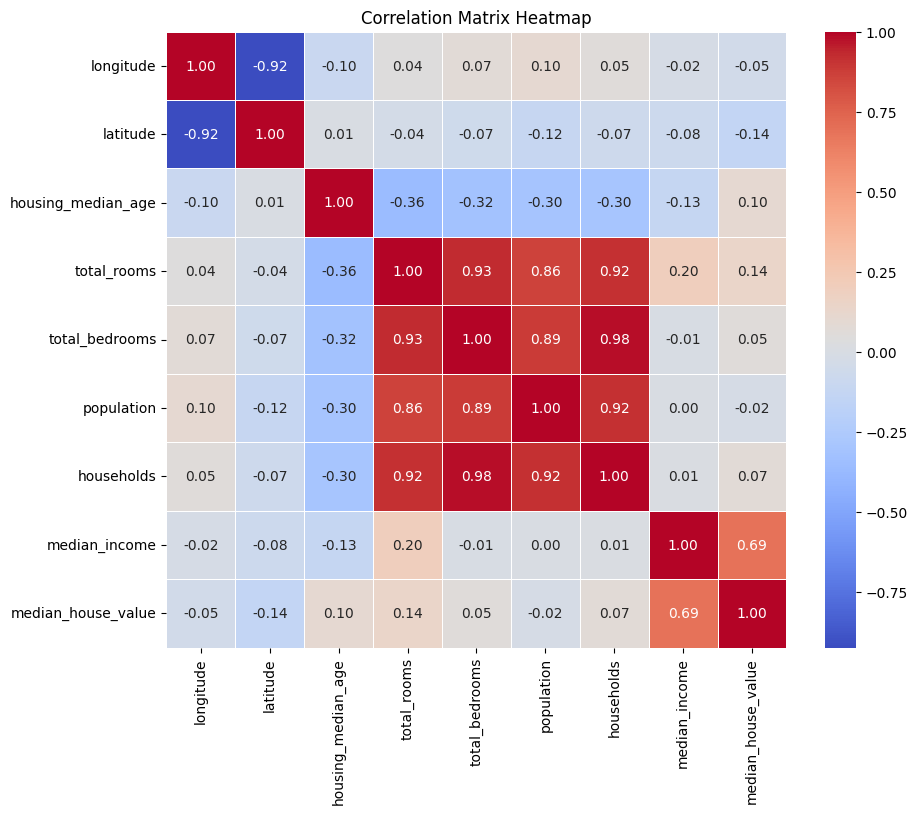

In [15]:
import seaborn as sns
# Select only numerical columns
numerical_columns = housing.select_dtypes(include=['number'])

# Compute the correlation matrix for numerical columns
correlation_matrix = numerical_columns.corr()

# Display the correlation matrix
print(correlation_matrix)

plt.figure(figsize=(10, 8))  # Set the figure size
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix Heatmap")
plt.show()

# Tips for Understanding the Correlation Matrix Heatmap

## 1. Understand the Basics of Correlation
- **Correlation Coefficient (r)**: Measures the strength and direction of the linear relationship between two variables.
  - Values range from **-1 to 1**:
    - **1**: Perfect positive correlation (as one increases, the other increases).
    - **-1**: Perfect negative correlation (as one increases, the other decreases).
    - **0**: No linear correlation.
  - The closer the value is to **1** or **-1**, the stronger the relationship.

- **Color Coding in Heatmap**:
  - Typically, red (or dark colors) indicates strong positive correlation.
  - Blue (or light colors) indicates strong negative correlation.
  - White or neutral colors indicate weak or no correlation.

---

## 2. Identify Features with Low Correlation to the Target Variable
- Look at the row/column corresponding to the **target variable** (e.g., `median_house_value` in the California housing dataset).
- Features with very low correlation (close to **0**) with the target variable are likely to have little predictive power and can be considered for removal.

**Example**:
- If `total_bedrooms` has a correlation of `0.05` with `median_house_value`, it likely doesn't contribute much to the model and can be dropped.

---

## 3. Identify Highly Correlated Features (Multicollinearity)
- Look for pairs of features with a **high absolute correlation** (e.g., `|r| > 0.8` or `|r| > 0.9`).
- High correlation between two features indicates **multicollinearity**, meaning they provide redundant information. Including both in the model can:
  - Lead to overfitting.
  - Make the model harder to interpret.
  - Cause instability in regression coefficients.

### Steps to Handle Highly Correlated Features:
1. **Drop One of the Features**:
   - If two features are highly correlated, drop the one that is less correlated with the target variable.
   - Example: If `total_rooms` and `households` are highly correlated, but `total_rooms` has a stronger correlation with the target, drop `households`.

2. **Combine Features**:
   - Instead of dropping, you can combine correlated features into a new feature (e.g., ratios or sums).
   - Example: Combine `total_rooms` and `households` into `rooms_per_household`.

---

## 4. Use Domain Knowledge
- Some features may have low correlation with the target but are still important due to domain knowledge.
  - Example: In the California housing dataset, `latitude` and `longitude` may not have a high direct correlation with `median_house_value`, but they are critical for capturing geographic trends.

---

## 5. Thresholds for Feature Selection
Here are some general guidelines for deciding which features to drop or keep:
- **Low Correlation with Target**:
  - Drop features with a correlation coefficient close to **0** (e.g., `|r| < 0.1`).
  - Exception: Keep features that are important based on domain knowledge.
- **High Correlation Between Features**:
  - If two features have a correlation of **|r| > 0.8**, consider dropping one of them.
  - Use the feature with the stronger correlation to the target variable.


## 6. Automate Feature Selection
If you want to automate the process of identifying unimportant or highly correlated features, you can use tools like:
1.  **Correlation Threshold**: Automatically drop features with high correlation.
2.  **Feature Importance**: Use feature importance scores from models like Random Forest or Gradient Boosting.
3.  **Variance Threshold**: Remove features with low variance. Make sure to remove target variable!



In [16]:
# **Correlation Threshold**
# Remove features with correlation > 0.8
import numpy as np
numerical_columns
correlation_matrix = numerical_columns.corr()


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
13096,-122.42,37.80,52.0,3321.0,1115.0,1576.0,1034.0,2.0987,458300.0
14973,-118.38,34.14,40.0,1965.0,354.0,666.0,357.0,6.0876,483800.0
3785,-121.98,38.36,33.0,1083.0,217.0,562.0,203.0,2.4330,101700.0
14689,-117.11,33.75,17.0,4174.0,851.0,1845.0,780.0,2.2618,96100.0
20507,-118.15,33.77,36.0,4366.0,1211.0,1912.0,1172.0,3.5292,361800.0
...,...,...,...,...,...,...,...,...,...
14207,-118.40,33.86,41.0,2237.0,597.0,938.0,523.0,4.7105,500001.0
13105,-119.31,36.32,23.0,2945.0,592.0,1419.0,532.0,2.5733,88800.0
19301,-117.06,32.59,13.0,3920.0,775.0,2814.0,760.0,4.0616,148800.0
19121,-118.40,34.06,37.0,3781.0,873.0,1725.0,838.0,4.1455,500001.0


In [18]:
high_corr = correlation_matrix.abs() > 0.8
correlation_matrix.abs()["population"] > 0.8

longitude             False
latitude              False
housing_median_age    False
total_rooms            True
total_bedrooms         True
population             True
households             True
median_income         False
median_house_value    False
Name: population, dtype: bool

In [ ]:
numerical_columns

In [19]:
from sklearn.ensemble import RandomForestRegressor
import pandas as pd


target = [1, 0, 1, 0, 1]  # Example target variable
df = numerical_columns.iloc[:, :-1]
target = numerical_columns["median_house_value"]

# Train a Random Forest Regressor
model = RandomForestRegressor(random_state=42)
model.fit(df, target)

# Get feature importance scores
feature_importances = pd.DataFrame({
    'Feature': df.columns,
    'Importance': model.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Select the most important features (e.g., Importance > 0.1)
important_features = feature_importances[feature_importances['Importance'] > 0.1]['Feature']
df_selected = df[important_features]

print("Feature Importance Scores:")
print(feature_importances)
print("\nDataFrame with selected important features:")
print(df_selected)

RandomForestRegressor(random_state=42)

Feature Importance Scores:
              Feature  Importance
7       median_income    0.513788
0           longitude    0.162002
1            latitude    0.148822
2  housing_median_age    0.064512
5          population    0.036022
4      total_bedrooms    0.030122
3         total_rooms    0.024865
6          households    0.019867

DataFrame with selected important features:
       median_income  longitude  latitude
13096         2.0987    -122.42     37.80
14973         6.0876    -118.38     34.14
3785          2.4330    -121.98     38.36
14689         2.2618    -117.11     33.75
20507         3.5292    -118.15     33.77
...              ...        ...       ...
14207         4.7105    -118.40     33.86
13105         2.5733    -119.31     36.32
19301         4.0616    -117.06     32.59
19121         4.1455    -118.40     34.06
19888         3.2833    -122.41     37.66

[16512 rows x 3 columns]


In [20]:
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler

# Apply VarianceThreshold
# Set a threshold for variance (e.g., 0.01)
selector = VarianceThreshold(threshold=0.001)
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Apply VarianceThreshold
# Set a threshold for variance (e.g., 0.01)
selector = VarianceThreshold(threshold=0.01)
df_selected = selector.fit_transform(df_scaled)

# Get the remaining feature names
remaining_columns = df.columns[selector.get_support()]

# Create a new DataFrame with selected features
df_selected_df = pd.DataFrame(df_selected, columns=remaining_columns)

print("Original Features:")
print(df.columns.tolist())
print("\nFeatures Remaining After Applying Variance Threshold:")
print(remaining_columns)

Original Features:
['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income']

Features Remaining After Applying Variance Threshold:
Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income'],
      dtype='object')


<Axes: xlabel='longitude', ylabel='latitude'>

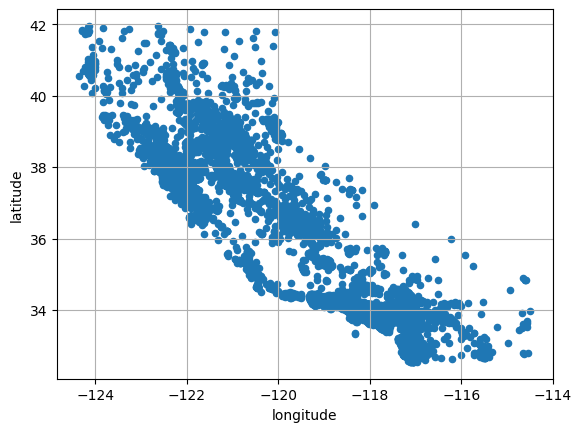

In [21]:
housing.plot(kind="scatter", x="longitude", y="latitude", grid=True)
plt.show()

<Axes: xlabel='longitude', ylabel='latitude'>

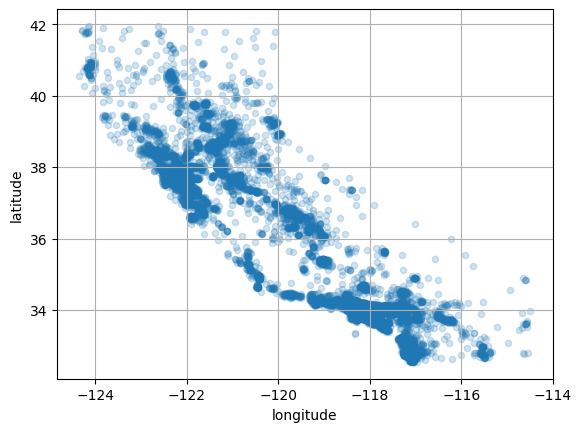

In [22]:
housing.plot(kind="scatter", x="longitude", y="latitude", grid=True, alpha=0.2)
plt.show()

<Axes: xlabel='longitude', ylabel='latitude'>

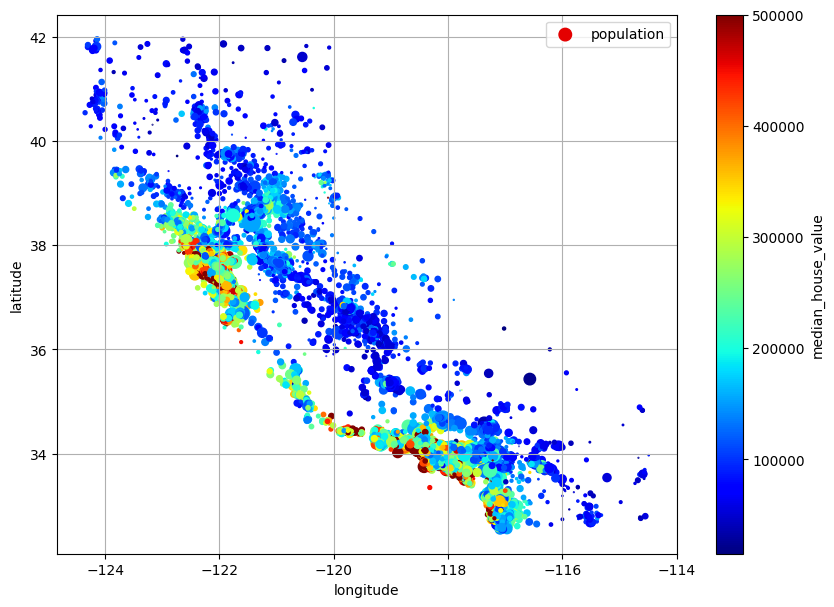

In [23]:
housing.plot(kind="scatter", x="longitude", y="latitude", grid=True,
             s=housing["population"] / 100, label="population",
             c="median_house_value", cmap="jet", colorbar=True,
             legend=True, sharex=False, figsize=(10, 7))
plt.show()

<Axes: xlabel='Longitude', ylabel='Latitude'>

(np.float64(-124.55),
 np.float64(-113.95),
 np.float64(32.45),
 np.float64(42.05))

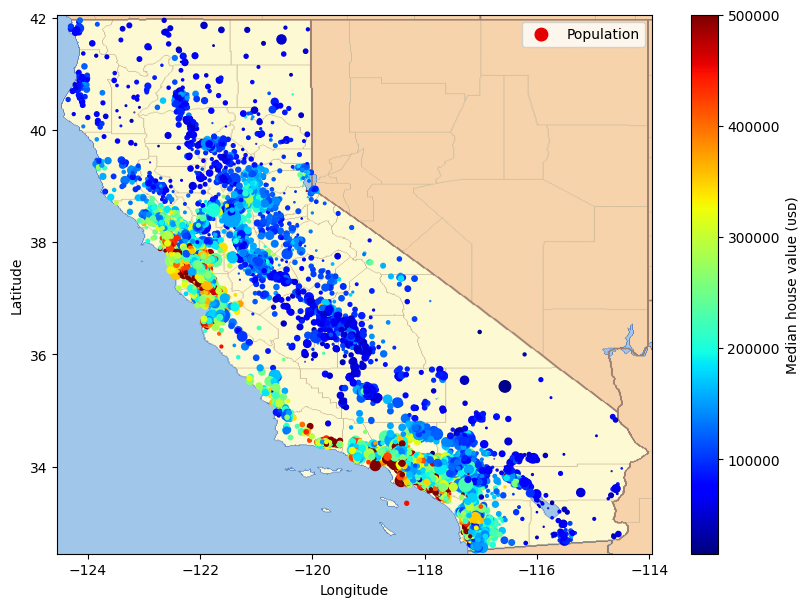

In [24]:
filename = "california.png"
housing_renamed = housing.rename(columns={
    "latitude": "Latitude", "longitude": "Longitude",
    "population": "Population",
    "median_house_value": "Median house value (ᴜsᴅ)"})
housing_renamed.plot(
             kind="scatter", x="Longitude", y="Latitude",
             s=housing_renamed["Population"] / 100, label="Population",
             c="Median house value (ᴜsᴅ)", cmap="jet", colorbar=True,
             legend=True, sharex=False, figsize=(10, 7))

california_img = plt.imread(filename)
axis = -124.55, -113.95, 32.45, 42.05
plt.axis(axis)
plt.imshow(california_img, extent=axis)


In [25]:
housing["rooms_per_house"] = housing["total_rooms"] / housing["households"]
housing["bedrooms_ratio"] = housing["total_bedrooms"] / housing["total_rooms"]
housing["people_per_house"] = housing["population"] / housing["households"]

                    longitude  latitude  housing_median_age  total_rooms  \
longitude            1.000000 -0.924213           -0.102937     0.044558   
latitude            -0.924213  1.000000            0.005692    -0.036753   
housing_median_age  -0.102937  0.005692            1.000000    -0.361710   
total_rooms          0.044558 -0.036753           -0.361710     1.000000   
total_bedrooms       0.068210 -0.066391           -0.317978     0.930076   
population           0.104236 -0.115677           -0.301906     0.863967   
households           0.054261 -0.071604           -0.300075     0.916143   
median_income       -0.016542 -0.078137           -0.127043     0.197720   
median_house_value  -0.050859 -0.139584            0.102175     0.137455   
rooms_per_house     -0.027899  0.108037           -0.153900     0.128631   
bedrooms_ratio       0.087802 -0.108871            0.139119    -0.183273   
people_per_house     0.024587 -0.026457            0.012771    -0.037702   

           

<Figure size 1000x800 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Correlation Matrix Heatmap')

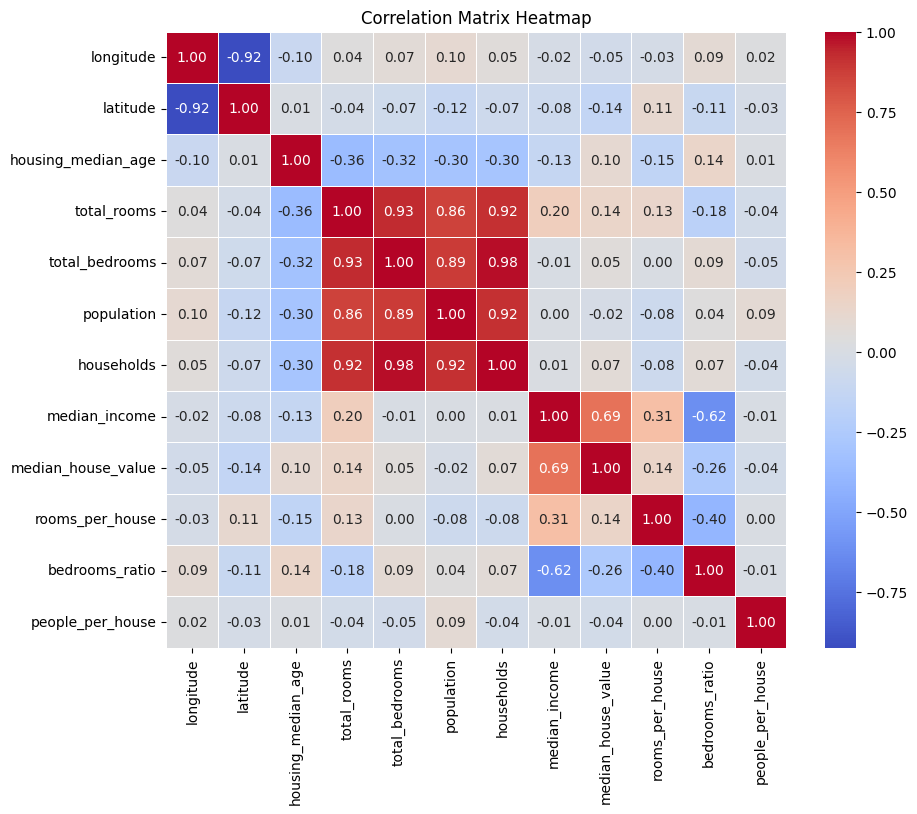

In [26]:
import seaborn as sns
# Select only numerical columns
numerical_columns = housing.select_dtypes(include=['number'])

# Compute the correlation matrix for numerical columns
correlation_matrix = numerical_columns.corr()

# Display the correlation matrix
print(correlation_matrix)

plt.figure(figsize=(10, 8))  # Set the figure size
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix Heatmap")
plt.show()

# Thursday Restart

In [87]:
import pandas as pd
from sklearn.model_selection import train_test_split

housing = pd.read_csv("./housing.csv") # https://github.com/ageron/data/tree/main/housing
housing["income_cat"] = pd.cut(housing["median_income"], bins=[0, 1.5, 3.0, 4.5, 6, np.inf], labels=[1, 2, 3, 4, 5])

strat_train_set, strat_test_set = train_test_split(housing, test_size=0.20, stratify=housing["income_cat"], random_state=42)
for set_ in (strat_train_set, strat_test_set):
    set_.drop("income_cat", axis=1, inplace=True)
housing = strat_train_set.drop("median_house_value", axis=1)
housing_labels = strat_train_set["median_house_value"].copy()

In [32]:
# Simple Feature Engineering via attribute combinations
housing["rooms_per_house"] = housing["total_rooms"] / housing["households"]
housing["bedrooms_ratio"] = housing["total_bedrooms"] / housing["total_rooms"]
housing["people_per_house"] = housing["population"] / housing["households"]
profile = ProfileReport(housing, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [43]:
# Data Preprocessing -- fix missing values
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy="median")

housing_num = housing.select_dtypes(include=[np.number])
imputer.fit(housing_num)
housing_num.describe()
pd.DataFrame(imputer.transform(housing_num), columns=housing_num.columns).describe()


SimpleImputer(strategy='median')

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_house,bedrooms_ratio,people_per_house
count,16512.000000,16512.000000,16512.000000,16512.000000,16344.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16344.000000,16512.000000
mean,-119.573125,35.637746,28.577156,2639.402798,538.949094,1425.513929,499.990189,3.870428,206333.518653,5.441010,0.212796,2.995974
std,2.000624,2.133294,12.585738,2185.287466,423.862079,1094.795467,382.865787,1.891936,115314.047529,2.574143,0.057417,4.457373
min,-124.350000,32.550000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000,0.888889,0.100000,0.692308
25%,-121.800000,33.930000,18.000000,1447.000000,296.000000,787.000000,279.000000,2.562500,119200.000000,4.443636,0.175257,2.433426
50%,-118.510000,34.260000,29.000000,2125.000000,434.000000,1167.000000,408.000000,3.538500,179200.000000,5.235573,0.203106,2.822316
75%,-118.010000,37.720000,37.000000,3154.000000,645.000000,1726.000000,603.000000,4.750000,263925.000000,6.053843,0.239421,3.286385
max,-114.490000,41.950000,52.000000,39320.000000,6210.000000,16305.000000,5358.000000,15.000100,500001.000000,141.909091,1.000000,502.461538


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_house,bedrooms_ratio,people_per_house
count,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000
mean,-119.573125,35.637746,28.577156,2639.402798,537.881298,1425.513929,499.990189,3.870428,206333.518653,5.441010,0.212697,2.995974
std,2.000624,2.133294,12.585738,2185.287466,421.831667,1094.795467,382.865787,1.891936,115314.047529,2.574143,0.057132,4.457373
min,-124.350000,32.550000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000,0.888889,0.100000,0.692308
25%,-121.800000,33.930000,18.000000,1447.000000,297.000000,787.000000,279.000000,2.562500,119200.000000,4.443636,0.175569,2.433426
50%,-118.510000,34.260000,29.000000,2125.000000,434.000000,1167.000000,408.000000,3.538500,179200.000000,5.235573,0.203106,2.822316
75%,-118.010000,37.720000,37.000000,3154.000000,642.000000,1726.000000,603.000000,4.750000,263925.000000,6.053843,0.238909,3.286385
max,-114.490000,41.950000,52.000000,39320.000000,6210.000000,16305.000000,5358.000000,15.000100,500001.000000,141.909091,1.000000,502.461538


In [48]:
# Data Preprocessing -- Handle text attributes
from sklearn.preprocessing import OneHotEncoder

### one hot encoder can handle unknown values by ignoring them! Look up documentation

housing_cat = housing.select_dtypes(include=['object'])
cat_encoder = OneHotEncoder()
housing_cat_1hot = cat_encoder.fit_transform(housing_cat)
housing_cat_1hot.toarray()
cat_encoder.categories_

array([[0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1.]])

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
       dtype=object)]

In [ ]:
# Data Preprocessing -- Feature Scaling 
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler(feature_range=(-1, 1))
housing_num_min_max_scaled = min_max_scaler.fit_transform(housing_num)

from sklearn.preprocessing import StandardScaler

std_scaler = StandardScaler()
housing_num_std_scaled = std_scaler.fit_transform(housing_num)


In [49]:
# Data Preprocessing -- Custom Transformers

from sklearn.preprocessing import FunctionTransformer
log_transformer = FunctionTransformer(np.log, inverse_func=np.exp)
log_pop = log_transformer.transform(housing[["population"]])

In [50]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_array, check_is_fitted

class StandardScalerClone(BaseEstimator, TransformerMixin):
    def __init__(self, with_mean=True):  # no *args or **kwargs!
        self.with_mean = with_mean

    def fit(self, X, y=None):  # y is required even though we don't use it
        X = check_array(X)  # checks that X is an array with finite float values
        self.mean_ = X.mean(axis=0)
        self.scale_ = X.std(axis=0)
        self.n_features_in_ = X.shape[1]  # every estimator stores this in fit()
        return self  # always return self!

    def transform(self, X):
        check_is_fitted(self)  # looks for learned attributes (with trailing _)
        X = check_array(X)
        assert self.n_features_in_ == X.shape[1]
        if self.with_mean:
            X = X - self.mean_
        return X / self.scale_

In [ ]:
from sklearn.cluster import KMeans

class ClusterSimilarity(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=10, gamma=1.0, random_state=None):
        self.n_clusters = n_clusters
        self.gamma = gamma
        self.random_state = random_state

    def fit(self, X, y=None, sample_weight=None):
        self.kmeans_ = KMeans(self.n_clusters, n_init=10,
                              random_state=self.random_state)
        self.kmeans_.fit(X, sample_weight=sample_weight)
        return self  # always return self!

    def transform(self, X):
        return rbf_kernel(X, self.kmeans_.cluster_centers_, gamma=self.gamma)
    
    def get_feature_names_out(self, names=None):
        return [f"Cluster {i} similarity" for i in range(self.n_clusters)]

In [82]:
import numpy as np
from sklearn.datasets import make_blobs
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.cluster import KMeans

# Define the ClusterSimilarity class
class ClusterSimilarity(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=10, gamma=1.0, random_state=None):
        self.n_clusters = n_clusters
        self.gamma = gamma
        self.random_state = random_state

    def fit(self, X, y=None, sample_weight=None):
        self.kmeans_ = KMeans(self.n_clusters, n_init=10, random_state=self.random_state)
        self.kmeans_.fit(X, sample_weight=sample_weight)
        return self  # always return self!

    def transform(self, X):
        return rbf_kernel(X, self.kmeans_.cluster_centers_, gamma=self.gamma)

    def fit_transform(self, X, y=None, sample_weight=None):
        self.fit(X, y, sample_weight)
        return self.transform(X)

    def get_feature_names_out(self, names=None):
        return [f"Cluster {i} similarity" for i in range(self.n_clusters)]

# Generate some sample data
X, y = make_blobs(n_samples=10, centers=3, n_features=2, random_state=42)

# Instantiate the ClusterSimilarity transformer
cluster_sim = ClusterSimilarity(n_clusters=3, gamma=0.5, random_state=42)

# Fit and transform the data
similarity_matrix = cluster_sim.fit_transform(X)

# Print the original data and the resulting similarity matrix
print("Original Data (X):")
print(X)
print("\nCluster Centers:")
print(cluster_sim.kmeans_.cluster_centers_)
print("\nSimilarity Matrix (fit_transform output):")
print(similarity_matrix)

Original Data (X):
[[-5.41397842 -7.10588589]
 [-7.42400992 -6.769187  ]
 [ 3.62704772  2.28741702]
 [-6.81209899 -8.30485778]
 [-2.26723535  7.10100588]
 [-2.97867201  9.55684617]
 [-0.92998481  9.78172086]
 [ 2.914961    1.41088215]
 [ 3.73185476  0.56086598]
 [-2.97261532  8.54855637]]

Cluster Centers:
[[-6.55002911 -7.39331023]
 [-2.28712687  8.74703232]
 [ 3.42462116  1.41972172]]

Similarity Matrix (fit_transform output):
[[5.03278314e-01 2.01625537e-57 1.78942476e-33]
 [5.61756878e-01 9.79826866e-59 7.61772432e-41]
 [1.44263700e-43 2.20758932e-17 6.72377177e-01]
 [6.37755829e-01 2.59768844e-68 5.12843842e-44]
 [2.49800830e-50 2.57973257e-01 9.04006383e-15]
 [6.95471207e-66 5.67215161e-01 5.23079534e-24]
 [1.22170360e-71 2.33118709e-01 4.99726363e-20]
 [5.18478201e-37 2.73497668e-18 8.78169364e-01]
 [2.01903751e-37 3.81418698e-23 6.59671807e-01]
 [1.08267553e-58 7.75192762e-01 1.19631119e-20]]


<Axes: xlabel='Longitude', ylabel='Latitude'>

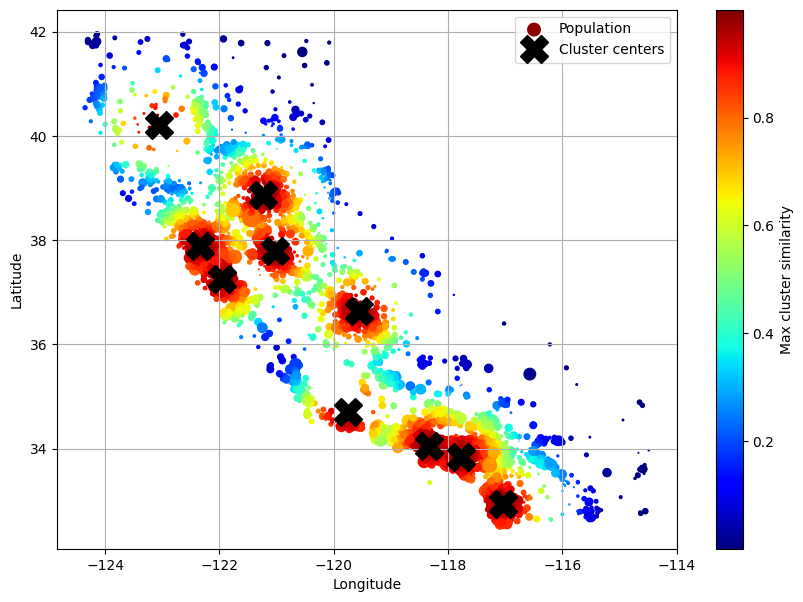

In [56]:
cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1., random_state=42)
similarities = cluster_simil.fit_transform(housing[["latitude", "longitude"]],
                                           sample_weight=housing_labels)

housing_renamed = housing.rename(columns={
    "latitude": "Latitude", "longitude": "Longitude",
    "population": "Population",
    "median_house_value": "Median house value (ᴜsᴅ)"})
housing_renamed["Max cluster similarity"] = similarities.max(axis=1)

housing_renamed.plot(kind="scatter", x="Longitude", y="Latitude", grid=True,
                     s=housing_renamed["Population"] / 100, label="Population",
                     c="Max cluster similarity",
                     cmap="jet", colorbar=True,
                     legend=True, sharex=False, figsize=(10, 7))
plt.plot(cluster_simil.kmeans_.cluster_centers_[:, 1],
         cluster_simil.kmeans_.cluster_centers_[:, 0],
         linestyle="", color="black", marker="X", markersize=20,
         label="Cluster centers")
plt.legend(loc="upper right")
plt.show()

# It's pipelining time!

In [60]:
from sklearn.pipeline import Pipeline

num_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("standardize", StandardScaler()),
])

num_pipeline
num_pipeline.named_steps
from sklearn.pipeline import make_pipeline

num_pipeline = make_pipeline(SimpleImputer(strategy="median"), StandardScaler())
from sklearn import set_config


num_pipeline
num_pipeline.named_steps

Pipeline(steps=[('impute', SimpleImputer(strategy='median')),
                ('standardize', StandardScaler())])

{'impute': SimpleImputer(strategy='median'), 'standardize': StandardScaler()}

Pipeline(steps=[('simpleimputer', SimpleImputer(strategy='median')),
                ('standardscaler', StandardScaler())])

{'simpleimputer': SimpleImputer(strategy='median'),
 'standardscaler': StandardScaler()}

In [61]:
housing_num_prepared = num_pipeline.fit_transform(housing_num)
housing_num_prepared[:2].round(2)

array([[-1.42,  1.01,  1.86,  0.31,  1.37,  0.14,  1.39, -0.94,  2.19,
        -0.87,  2.15, -0.33],
       [ 0.6 , -0.7 ,  0.91, -0.31, -0.44, -0.69, -0.37,  1.17,  2.41,
         0.02, -0.57, -0.25]])

In [63]:
df_housing_num_prepared = pd.DataFrame(
    housing_num_prepared, columns=num_pipeline.get_feature_names_out(),
    index=housing_num.index)
df_housing_num_prepared.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_house,bedrooms_ratio,people_per_house
13096,-1.423037,1.013606,1.861119,0.311912,1.368167,0.137460,1.394812,-0.936491,2.185112,-0.866027,2.153743,-0.330204
14973,0.596394,-0.702103,0.907630,-0.308620,-0.435925,-0.693771,-0.373485,1.171942,2.406254,0.024550,-0.569651,-0.253616
3785,-1.203098,1.276119,0.351428,-0.712240,-0.760709,-0.788768,-0.775727,-0.759789,-0.907406,-0.041193,-0.215784,-0.051041
14689,1.231216,-0.884924,-0.919891,0.702262,0.742306,0.383175,0.731375,-0.850281,-0.955971,-0.034858,-0.154314,-0.141475
20507,0.711362,-0.875549,0.589800,0.790125,1.595753,0.444376,1.755263,-0.180365,1.348242,-0.666554,1.132023,-0.306148


In [64]:
# Explicit
from sklearn.compose import ColumnTransformer

num_attribs = ["longitude", "latitude", "housing_median_age", "total_rooms",
               "total_bedrooms", "population", "households", "median_income"]
cat_attribs = ["ocean_proximity"]

cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))

preprocessing = ColumnTransformer([
    ("num", num_pipeline, num_attribs),
    ("cat", cat_pipeline, cat_attribs),
])

In [68]:
# Programmatic

from sklearn.compose import make_column_selector, make_column_transformer

preprocessing = make_column_transformer(
    (num_pipeline, make_column_selector(dtype_include=np.number)),
    (cat_pipeline, make_column_selector(dtype_include=object)),
)

In [69]:
housing_prepared = preprocessing.fit_transform(housing)
housing_prepared_fr = pd.DataFrame(
    housing_prepared,
    columns=preprocessing.get_feature_names_out(),
    index=housing.index)
housing_prepared_fr.head(2)

,pipeline-1__longitude,pipeline-1__latitude,pipeline-1__housing_median_age,pipeline-1__total_rooms,pipeline-1__total_bedrooms,pipeline-1__population,pipeline-1__households,pipeline-1__median_income,pipeline-1__median_house_value,pipeline-1__rooms_per_house,pipeline-1__bedrooms_ratio,pipeline-1__people_per_house,pipeline-2__ocean_proximity_<1H OCEAN,pipeline-2__ocean_proximity_INLAND,pipeline-2__ocean_proximity_ISLAND,pipeline-2__ocean_proximity_NEAR BAY,pipeline-2__ocean_proximity_NEAR OCEAN
13096,-1.423037,1.013606,1.861119,0.311912,1.368167,0.137460,1.394812,-0.936491,2.185112,-0.866027,2.153743,-0.330204,0.0,0.0,0.0,1.0,0.0
14973,0.596394,-0.702103,0.907630,-0.308620,-0.435925,-0.693771,-0.373485,1.171942,2.406254,0.024550,-0.569651,-0.253616,1.0,0.0,0.0,0.0,0.0


In [88]:
def column_ratio(X):
    return X[:, [0]] / X[:, [1]]

def ratio_name(function_transformer, feature_names_in):
    return ["ratio"]  # feature names out

def ratio_pipeline():
    return make_pipeline(
        SimpleImputer(strategy="median"),
        FunctionTransformer(column_ratio, feature_names_out=ratio_name),
        StandardScaler())

log_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    FunctionTransformer(np.log, feature_names_out="one-to-one"),
    StandardScaler())
cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1., random_state=42)
default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())
preprocessing = ColumnTransformer([
        ("bedrooms", ratio_pipeline(), ["total_bedrooms", "total_rooms"]),
        ("rooms_per_house", ratio_pipeline(), ["total_rooms", "households"]),
        ("people_per_house", ratio_pipeline(), ["population", "households"]),
        ("log", log_pipeline, ["total_bedrooms", "total_rooms", "population",
                               "households", "median_income"]),
        ("geo", cluster_simil, ["latitude", "longitude"]),
        ("cat", cat_pipeline, make_column_selector(dtype_include=object)),
    ],
    remainder=default_num_pipeline)  # one column remaining: housing_median_age

### **Code Explanation**

#### **1. `column_ratio` Function**
```python
def column_ratio(X):
    return X[:, [0]] / X[:, [1]]
```
- This function takes a 2D array `X` as input and computes the ratio of the first column (`X[:, [0]]`) to the second column (`X[:, [1]]`).
- It assumes that `X` has at least two columns, and the operation is performed element-wise for all rows.

---

#### **2. `ratio_name` Function**
```python
def ratio_name(function_transformer, feature_names_in):
    return ["ratio"]  # feature names out
```
- This function is used to define the output feature name(s) for the `FunctionTransformer` that applies the `column_ratio` function.
- It always returns a single feature name, `"ratio"`, regardless of the input feature names.

---

#### **3. `ratio_pipeline` Function**
```python
def ratio_pipeline():
    return make_pipeline(
        SimpleImputer(strategy="median"),
        FunctionTransformer(column_ratio, feature_names_out=ratio_name),
        StandardScaler())
```
- This function creates a pipeline for preprocessing numerical data by:
  1. **Imputing missing values** using the median (`SimpleImputer(strategy="median")`).
  2. **Transforming the data** by applying the `column_ratio` function using `FunctionTransformer`.
  3. **Standardizing the data** using `StandardScaler` to ensure the output has a mean of 0 and a standard deviation of 1.

---

#### **4. `log_pipeline`**
```python
log_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    FunctionTransformer(np.log, feature_names_out="one-to-one"),
    StandardScaler())
```
- This pipeline preprocesses numerical data by:
  1. Imputing missing values with the median.
  2. Applying the natural logarithm transformation (`np.log`) to the data.
  3. Standardizing the transformed data.

---

#### **5. `cluster_simil`**
```python
cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1., random_state=42)
```
- This creates a `ClusterSimilarity` object, which transforms data into cluster similarity features.
- It clusters the data into 10 clusters and computes similarity scores for each cluster using a radial basis function (RBF) kernel with `gamma=1.0`.

---

#### **6. `default_num_pipeline`**
```python
default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())
```
- This pipeline handles numerical data by imputing missing values with the median and standardizing the data.

---

#### **7. `preprocessing`**
```python
preprocessing = ColumnTransformer([
        ("bedrooms", ratio_pipeline(), ["total_bedrooms", "total_rooms"]),
        ("rooms_per_house", ratio_pipeline(), ["total_rooms", "households"]),
        ("people_per_house", ratio_pipeline(), ["population", "households"]),
        ("log", log_pipeline, ["total_bedrooms", "total_rooms", "population",
                               "households", "median_income"]),
        ("geo", cluster_simil, ["latitude", "longitude"]),
        ("cat", cat_pipeline, make_column_selector(dtype_include=object)),
    ],
    remainder=default_num_pipeline)  # one column remaining: housing_median_age
```
- **Purpose**: This `ColumnTransformer` applies different preprocessing pipelines to different subsets of features in the dataset.
- **Transformations**:
  1. **`bedrooms`**: Applies the `ratio_pipeline` to compute the ratio of `total_bedrooms` to `total_rooms`.
  2. **`rooms_per_house`**: Applies the `ratio_pipeline` to compute the ratio of `total_rooms` to `households`.
  3. **`people_per_house`**: Applies the `ratio_pipeline` to compute the ratio of `population` to `households`.
  4. **`log`**: Applies the `log_pipeline` to transform several numerical features using the natural logarithm.
  5. **`geo`**: Applies the `ClusterSimilarity` transformation to latitude and longitude.
  6. **`cat`**: Applies a categorical pipeline (`cat_pipeline`) to all categorical features (selected using `make_column_selector(dtype_include=object)`).
- **`remainder` Parameter**:
  - The `remainder` parameter specifies how to handle columns that are not explicitly listed in the `ColumnTransformer`.
  - Here, it is set to `default_num_pipeline`, meaning that any remaining columns (in this case, `housing_median_age`) will be processed using the `default_num_pipeline` (imputation + standardization).

---

### **Role of the `remainder` Parameter**
The `remainder` parameter in `ColumnTransformer` determines what happens to columns that are not explicitly mentioned in the transformations. It can take the following values:
1. **`"drop"` (default)**: Drops any columns not specified in the transformations.
2. **`"passthrough"`**: Leaves the remaining columns unchanged and includes them in the output.
3. **A pipeline or transformer**: Applies the specified pipeline or transformer to the remaining columns.

In this code:
```python
remainder=default_num_pipeline
```
- The `default_num_pipeline` (imputation + standardization) is applied to the remaining column, `housing_median_age`.

---

### **Summary**
- The code defines a preprocessing pipeline for a dataset, applying different transformations to different feature groups.
- The `remainder` parameter ensures that any columns not explicitly mentioned (like `housing_median_age`) are still processed using a default pipeline.
- The `ratio_pipeline` computes ratios between pairs of columns, while other pipelines handle logarithmic transformations, clustering, and categorical data.

In [79]:
ratio_pipeline().fit_transform(housing[["total_rooms", "households"]])


['T',
 '__abs__',
 '__add__',
 '__and__',
 '__array__',
 '__array_finalize__',
 '__array_function__',
 '__array_interface__',
 '__array_namespace__',
 '__array_priority__',
 '__array_struct__',
 '__array_ufunc__',
 '__array_wrap__',
 '__bool__',
 '__buffer__',
 '__class__',
 '__class_getitem__',
 '__complex__',
 '__contains__',
 '__copy__',
 '__deepcopy__',
 '__delattr__',
 '__delitem__',
 '__dir__',
 '__divmod__',
 '__dlpack__',
 '__dlpack_device__',
 '__doc__',
 '__eq__',
 '__float__',
 '__floordiv__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__iadd__',
 '__iand__',
 '__ifloordiv__',
 '__ilshift__',
 '__imatmul__',
 '__imod__',
 '__imul__',
 '__index__',
 '__init__',
 '__init_subclass__',
 '__int__',
 '__invert__',
 '__ior__',
 '__ipow__',
 '__irshift__',
 '__isub__',
 '__iter__',
 '__itruediv__',
 '__ixor__',
 '__le__',
 '__len__',
 '__lshift__',
 '__lt__',
 '__matmul__',
 '__mod__',
 '__mul__',
 '__ne__',
 '__neg__',


In [76]:
housing[["total_rooms", "households"]]

,total_rooms,households
13096,3321.0,1034.0
14973,1965.0,357.0
3785,1083.0,203.0
14689,4174.0,780.0
20507,4366.0,1172.0
...,...,...
14207,2237.0,523.0
13105,2945.0,532.0
19301,3920.0,760.0
19121,3781.0,838.0


In [89]:
housing_prepared = preprocessing.fit_transform(housing)
housing_prepared.shape

(16512, 24)

In [90]:
preprocessing.get_feature_names_out()

array(['bedrooms__ratio', 'rooms_per_house__ratio',
       'people_per_house__ratio', 'log__total_bedrooms',
       'log__total_rooms', 'log__population', 'log__households',
       'log__median_income', 'geo__Cluster 0 similarity',
       'geo__Cluster 1 similarity', 'geo__Cluster 2 similarity',
       'geo__Cluster 3 similarity', 'geo__Cluster 4 similarity',
       'geo__Cluster 5 similarity', 'geo__Cluster 6 similarity',
       'geo__Cluster 7 similarity', 'geo__Cluster 8 similarity',
       'geo__Cluster 9 similarity', 'cat__ocean_proximity_<1H OCEAN',
       'cat__ocean_proximity_INLAND', 'cat__ocean_proximity_ISLAND',
       'cat__ocean_proximity_NEAR BAY', 'cat__ocean_proximity_NEAR OCEAN',
       'remainder__housing_median_age'], dtype=object)

# It's Modeling time!

In [92]:
from sklearn.linear_model import LinearRegression

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(housing, housing_labels)
housing_predictions = lin_reg.predict(housing)
housing_predictions[:5].round(-2) 
housing_labels.iloc[:5].values

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('bedrooms',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function ratio_name at 0x7f8...
                                                   'median_income']),
                                                 ('geo',
                                                  ClusterSimilarity(random_state=42),
                                                  ['latitude', 'longitude']),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7f8134ae6ea0>)])),
                ('linearregression', LinearRegression())])

array([242800., 375900., 127500.,  99400., 324600.])

array([458300., 483800., 101700.,  96100., 361800.])

In [93]:
error_ratios = housing_predictions[:5].round(-2) / housing_labels.iloc[:5].values - 1
print(", ".join([f"{100 * ratio:.1f}%" for ratio in error_ratios]))

-47.0%, -22.3%, 25.4%, 3.4%, -10.3%


In [95]:
from sklearn.metrics import root_mean_squared_error

lin_rmse = root_mean_squared_error(housing_labels, housing_predictions)
lin_rmse

np.float64(68647.95686706669)

In [96]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = make_pipeline(preprocessing, DecisionTreeRegressor(random_state=42))
tree_reg.fit(housing, housing_labels)
housing_predictions = tree_reg.predict(housing)
tree_rmse = root_mean_squared_error(housing_labels, housing_predictions)
tree_rmse

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('bedrooms',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function ratio_name at 0x7f8...
                                                  ClusterSimilarity(random_state=42),
                                                  ['latitude', 'longitude']),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7f8134ae6ea0>)])),
                ('decisiontreeregressor',
                 DecisionTreeRegressor(random_state=42))])

np.float64(0.0)

In [102]:
from sklearn.model_selection import cross_val_score

tree_rmses = -cross_val_score(tree_reg, housing, housing_labels,
                              scoring="neg_root_mean_squared_error", cv=10)

# The cross_val_score function returns scores where higher is better. 
# For metrics like RMSE (where lower is better), scikit-learn negates the values to fit this convention.



### Cross-Validation

The data is split into non-overlapping subsets (folds), meaning each data point is used exactly once as part of the validation set and exactly \(k-1\) times as part of the training set during \(k\)-fold cross-validation.

---

### **How Are Data Selected for a Fold?**

#### **Splitting the Data**
- The dataset is divided into \(k\) approximately equal-sized subsets (folds) **without replacement**.
- Each fold contains a unique subset of the data, and no data point is repeated across folds.

In [98]:
pd.Series(tree_rmses).describe()

count       10.000000
mean     67153.318273
std       1963.580924
min      63925.253106
25%      66083.277180
50%      66795.829871
75%      68074.018403
max      70664.635833
dtype: float64

In [103]:
lin_rmses = -cross_val_score(lin_reg, housing, housing_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

count       10.000000
mean     69847.923224
std       4078.407329
min      65659.761079
25%      68088.799156
50%      68697.591463
75%      69800.966364
max      80685.254832
dtype: float64

In [104]:
from sklearn.ensemble import RandomForestRegressor

forest_reg = make_pipeline(preprocessing,
                           RandomForestRegressor(random_state=42))
forest_rmses = -cross_val_score(forest_reg, housing, housing_labels,
                                scoring="neg_root_mean_squared_error", cv=10)
pd.Series(forest_rmses).describe()

count       10.000000
mean     47002.931706
std       1048.451340
min      45667.064036
25%      46494.358345
50%      47093.173938
75%      47274.873814
max      49354.705514
dtype: float64

In [105]:
forest_reg.fit(housing, housing_labels)
housing_predictions = forest_reg.predict(housing)
forest_rmse = mean_squared_error(housing_labels, housing_predictions,
                                 squared=False)
forest_rmse

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('bedrooms',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function ratio_name at 0x7f8...
                                                  ClusterSimilarity(random_state=42),
                                                  ['latitude', 'longitude']),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7f8134ae6ea0>)])),
                ('randomforestregressor',
                 RandomForestRegressor(random_state=42))])

/home/mkzia/anaconda3/envs/eas503book/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


np.float64(17547.52124624957)

In [ ]:
forest_reg.get_params()

# Fine-Tune Your Model

In [106]:
from sklearn.model_selection import GridSearchCV

full_pipeline = Pipeline([
    ("preprocessing", preprocessing),
    ("random_forest", RandomForestRegressor(random_state=42)),
])
param_grid = [
    {'preprocessing__geo__n_clusters': [5, 8, 10],
     'random_forest__max_features': [4, 6, 8]},
    {'preprocessing__geo__n_clusters': [10, 15],
     'random_forest__max_features': [6, 8, 10]},
]
grid_search = GridSearchCV(full_pipeline, param_grid, cv=3,
                           scoring='neg_root_mean_squared_error')
grid_search.fit(housing, housing_labels)

/home/mkzia/anaconda3/envs/eas503book/lib/python3.12/site-packages/numpy/ma/core.py:2846: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                                                     SimpleImputer(strategy='median')),
                                                                                    ('standardscaler',
                                                                                     StandardScaler())]),
                                                          transformers=[('bedrooms',
                                                                         Pipeline(steps=[('simpleimputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('functiontransformer',
                                                                                          FunctionTransformer(feature_names_out=<f...
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x7f8134ae6ea0>)])),
                                       ('random_forest',
                                        RandomForestRegressor(random_state=42))]),
             param_grid=[{'preprocessing__geo__n_clusters': [5, 8, 10],
                          'random_forest__max_features': [4, 6, 8]},
                         {'preprocessing__geo__n_clusters': [10, 15],
                          'random_forest__max_features': [6, 8, 10]}],
             scoring='neg_root_mean_squared_error')

In [107]:
grid_search.best_params_

{'preprocessing__geo__n_clusters': 15, 'random_forest__max_features': 6}

In [111]:
grid_search.best_score_

np.float64(-43952.588192716525)

In [108]:
cv_res = pd.DataFrame(grid_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)

# extra code – these few lines of code just make the DataFrame look nicer
cv_res = cv_res[["param_preprocessing__geo__n_clusters",
                 "param_random_forest__max_features", "split0_test_score",
                 "split1_test_score", "split2_test_score", "mean_test_score"]]
score_cols = ["split0", "split1", "split2", "mean_test_rmse"]
cv_res.columns = ["n_clusters", "max_features"] + score_cols
cv_res[score_cols] = -cv_res[score_cols].round().astype(np.int64)

cv_res.head()

,n_clusters,max_features,split0,split1,split2,mean_test_rmse
12,15,6,43536,43753,44569,43953
13,15,8,44084,44205,44863,44384
14,15,10,44368,44496,45200,44688
7,10,6,44251,44628,45857,44912
9,10,6,44251,44628,45857,44912


# Randomized Search

from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_distribs = {'preprocessing__geo__n_clusters': randint(low=3, high=50),
                  'random_forest__max_features': randint(low=2, high=20)}

rnd_search = RandomizedSearchCV(
    full_pipeline, param_distributions=param_distribs, n_iter=10, cv=3,
    scoring='neg_root_mean_squared_error', random_state=42)

rnd_search.fit(housing, housing_labels)

In [ ]:
cv_res = pd.DataFrame(rnd_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)
cv_res = cv_res[["param_preprocessing__geo__n_clusters",
                 "param_random_forest__max_features", "split0_test_score",
                 "split1_test_score", "split2_test_score", "mean_test_score"]]
cv_res.columns = ["n_clusters", "max_features"] + score_cols
cv_res[score_cols] = -cv_res[score_cols].round().astype(np.int64)
cv_res.head()

In [ ]:
final_model = rnd_search.best_estimator_  # includes preprocessing
feature_importances = final_model["random_forest"].feature_importances_
feature_importances.round(2)

# Drop Features!

In [ ]:
sorted(zip(feature_importances,
           final_model["preprocessing"].get_feature_names_out()),
           reverse=True)

In [109]:
# Use Test Data!

In [ ]:
X_test = strat_test_set.drop("median_house_value", axis=1)
y_test = strat_test_set["median_house_value"].copy()

final_predictions = final_model.predict(X_test)

final_rmse = mean_squared_error(y_test, final_predictions, squared=False)
print(final_rmse)

In [ ]:
import pandas as pd
import joblib

# Example: Save model metadata
metadata = {
    'model_name': ['RandomForestClassifier'],
    'accuracy': [0.95],
    'hyperparameters': ['n_estimators=100, max_depth=None']
}
df = pd.DataFrame(metadata)
df.to_csv('model_metadata.csv', index=False)

# Save the model
joblib.dump(model, 'random_forest_model.pkl')

In [116]:
import os

MLFLOW_TRACKING_URI="https://dagshub.com/mkzia/house_models.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME']='mkzia'
os.environ['MLFLOW_TRACKING_PASSWORD']='74e009243a2d975d70bfc3e424bd60f84c44137a'


import mlflow
from mlflow.models import infer_signature

# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)

# Create a new MLflow Experiment
mlflow.set_experiment("median_house_pricing")

score = -grid_search.best_score_
params = grid_search.best_params_
with mlflow.start_run():
      # Log the hyperparameters
      mlflow.log_params(params)

      # Log metrics
      mlflow.log_metric("RMSE", score)
      # Infer the model signature
      signature = infer_signature(housing, grid_search.best_estimator_.predict(housing))

      # Log the model
      model_info = mlflow.sklearn.log_model(
          sk_model=grid_search.best_estimator_,
          artifact_path="housing_model",
          signature=signature,
          input_example=housing,
          registered_model_name=grid_search.best_estimator_.__class__.__name__,
      )

<Experiment: artifact_location='mlflow-artifacts:/285c12440f594c9985930ce46304bb3d', creation_time=1714692541793, experiment_id='0', last_update_time=1714692541793, lifecycle_stage='active', name='median_house_pricing', tags={}>

Successfully registered model 'Pipeline'.
2024/12/05 15:47:57 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Pipeline, version 1
Created version '1' of model 'Pipeline'.


🏃 View run intrigued-tern-548 at: https://dagshub.com/mkzia/house_models.mlflow/#/experiments/0/runs/2a03bebc903e4e4582f4a494cdb9ef7d
🧪 View experiment at: https://dagshub.com/mkzia/house_models.mlflow/#/experiments/0


In [113]:
!pip install mlflow

  Using cached GitPython-3.1.43-py3-none-any.whl.metadata (13 kB)
  Using cached gitdb-4.0.11-py3-none-any.whl.metadata (1.2 kB)
  Using cached smmap-5.0.1-py3-none-any.whl.metadata (4.3 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.3/27.3 MB 22.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 21.1 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.1/40.1 MB 18.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 575.1/575.1 kB 8.2 MB/s eta 0:00:00
Using cached GitPython-3.1.43-py3-none-any.whl (207 kB)
Using cached gitdb-4.0.11-py3-none-any.whl (62 kB)
Using cached smmap-5.0.1-py3-none-any.whl (24 kB)
